In [ ]:
import sys
sys.path.insert(0, "../")

from datasets import load_dataset
from omegaconf import OmegaConf

import numpy as np
import torch
from einops import rearrange
from huggingface_hub import hf_hub_download
from IPython.utils import io
from torch.utils.data import DataLoader

from ldm.util import instantiate_from_config
from utils import collate_fn

from PIL import Image

from large_image_gen.resizer import Resizer
from large_image_gen.utils import model_pred, decode_large_image

import torch.nn.functional as F
from tqdm.auto import tqdm

import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

## Load Dataset

In [ ]:
# Magnification is encoded into 0-4
MAG_DICT = {
    "20x": 0,
    "10x": 1,
    "5x": 2,
    "2_5x": 3,
    "1_25x": 4,
}
MAG = "5x" # The sample dataset has 20x, 10x, 5x, 2_5x and 1_25x data

ds = load_dataset("StonyBrook-CVLab/ZoomLDM-demo-dataset", name=MAG, trust_remote_code=True, split='train')
dl = DataLoader(ds, batch_size=1, shuffle=True, collate_fn = collate_fn)

## Load ZoomLDM

In [4]:
device = torch.device('cuda:1')
torch.cuda.set_device(1)

ckpt_path = hf_hub_download(repo_id="StonyBrook-CVLab/ZoomLDM", filename="brca/weights.ckpt")
state_dict = torch.load(ckpt_path, weights_only=False)

config_path = hf_hub_download(repo_id="StonyBrook-CVLab/ZoomLDM", filename="brca/config.yaml")
config = OmegaConf.load(config_path)

with io.capture_output() as _:
    model = instantiate_from_config(config.model)
model = model.to(device).eval()
model.load_state_dict(state_dict);

# disable null token 
model.cond_stage_model.p_uncond = 0

## Infer embeddings

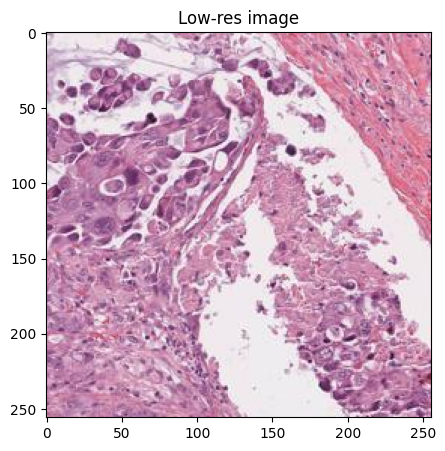

In [15]:
# We are given a low-res image
# We will infer the embeddings that generate the high-res patches of that image
# Inference is done by inverting the generative model
batch = next(iter(dl))
lr_image = batch['image']

plt.figure(figsize=(5,5))
plt.imshow(lr_image[0])
plt.title("Low-res image")
plt.show()

In [16]:
# Encode low-res image
img_latent = model.get_first_stage_encoding(model.encode_first_stage((2*(lr_image.permute([0,3,1,2])/255. - 0.5)).float().to(device)))
print("Latent:", img_latent.shape)

# Set condition inference parameters
# Decide lower magnification conditioning shape
cond_dim = 1024
mag_cond = torch.tensor([MAG_DICT[MAG]]).long().view(-1).to(device)
if MAG == "10x":
    emb_h, emb_w = 2, 2
elif MAG == "5x":
    emb_h, emb_w = 4, 4
elif MAG == "2_5x":
    emb_h, emb_w = 8, 8
elif MAG == "1_25x":
    emb_h, emb_w = 16, 16
# Embeddings to learn
cond_feat_learned = torch.randn((cond_dim,emb_h,emb_w), device=device ,requires_grad=True)

opt = torch.optim.Adam([cond_feat_learned], lr=1e-1)
print("Condition:", cond_feat_learned.shape)

num_steps = 200
timesteps = np.linspace(950, 50, num_steps) # We anneal the timestep
for idx, t in tqdm(enumerate(timesteps)):
    # Add noise to latent
    t = int(t)
    at = model.alphas_cumprod[t-1].view(1,1,1,1)
    eps = torch.randn_like(img_latent)
    xt = torch.sqrt(at)*img_latent + torch.sqrt(1-at)*eps

    # Compute denoising loss
    t_cond = torch.tensor([t]).float().to(device).view(1)
    with torch.cuda.amp.autocast():
        # Normalize
        ssl_feat_learned_norm = (cond_feat_learned - cond_feat_learned.mean(0, keepdim=True)) / cond_feat_learned.std(0, keepdim=True)
        cond_inp = dict(ssl_feat=[ssl_feat_learned_norm], mag=mag_cond)
        # Encode
        cond = model.cond_stage_model(cond_inp)
        # Denoiser
        pred_eps = model.model.diffusion_model(xt, t_cond, cond)

    # Backprop loss to condition
    w = at ** 0.5 * (1 - at)
    loss = (w*(pred_eps - eps)**2).mean()

    # Add inter-embedding similarity penalty
    # This helps the embeddings converge to similar values
    embs = cond_feat_learned
    embs = embs / torch.norm(embs, dim=0, keepdim=True)
    embs = embs.view(1024,-1)
    sim = (embs.view(1024,-1,1) * embs.view(1024,1,-1)).sum(0)
    loss += -0.05*sim.mean()

    # Update embeddings
    opt.zero_grad()
    loss.backward()
    opt.step()

Latent: torch.Size([1, 3, 64, 64])
Condition: torch.Size([1024, 4, 4])


200it [00:28,  7.07it/s]


In [17]:
# Generate patches for the learned embeddings
# Diffusion parameters
t0 = 1000
stride = 50
print("Total steps", t0//stride)
guidance = 2
batch_size = 2 # Reduce if GPU memory is limited

cond_feat_learned_norm = (cond_feat_learned - cond_feat_learned.mean(0, keepdim=True)) / cond_feat_learned.std(0, keepdim=True)

ssl_feat_20x = rearrange(cond_feat_learned_norm.detach(), 'd (p1 h) (p2 w) -> (p1 p2) d h w', p1=emb_h, p2=emb_w)
cond_dict_20x = dict(ssl_feat=[ssl_feat_20x[i] for i in range(ssl_feat_20x.shape[0])],
                        mag=torch.tensor([MAG_DICT["20x"]]).long().tile(ssl_feat_20x.shape[0]).to(device))
cond_20x_all = model.get_learned_conditioning(cond_dict_20x)

# Initial noise
xt_20x_all = torch.randn((emb_h*emb_w,3,64,64), device=device)

for idx, t in tqdm(enumerate(range(t0, 0, -stride)), total=t0//stride):
    # Schedule parameters
    atbar = model.alphas_cumprod[t-1].view(1,1,1,1).to(device)
    atbar_prev = model.alphas_cumprod[max(t-1-stride,0)].view(1,1,1,1).to(device)
    beta_tilde = (model.betas[t-1] * (1 - atbar_prev) / (1 - atbar)).view(1,1,1,1).to(device)

    # Denoise all patches at 20x
    x0_pred_20x_all = []
    eps_20x_all = []
    for idx_20x in range(0, xt_20x_all.shape[0], batch_size):
        # Select patches
        xt_20x = xt_20x_all[idx_20x:idx_20x+batch_size,...]
        cond_20x = cond_20x_all[idx_20x:idx_20x+batch_size,...]

        # Predict noise for 20x
        epsilon_20x = model_pred(model, xt_20x, t, cond_20x, w=guidance)
        x0_pred_20x = xt_20x / torch.sqrt(atbar) - epsilon_20x * torch.sqrt((1-atbar)/atbar)
        img_pred_20x = model.decode_first_stage(x0_pred_20x).clamp(-1,1)
            
        # Once finished, add to list of 20x patches we are generating
        x0_pred_20x_all.append(x0_pred_20x)
        eps_20x_all.append(epsilon_20x)

    # Collect patches
    x0_pred_20x_all = torch.cat(x0_pred_20x_all, dim=0)
    eps_20x_all = torch.cat(eps_20x_all, dim=0)

    # Perform denoising step
    xt_20x_all = torch.sqrt(atbar_prev)*x0_pred_20x_all + torch.sqrt(1-atbar_prev)*eps_20x_all + torch.sqrt(beta_tilde)*torch.randn_like(xt_20x_all)

Total steps 20


  0%|          | 0/20 [00:00<?, ?it/s]

100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


Images 20x: torch.Size([16, 3, 256, 256])


/tmp/ipykernel_2526561/1355740166.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


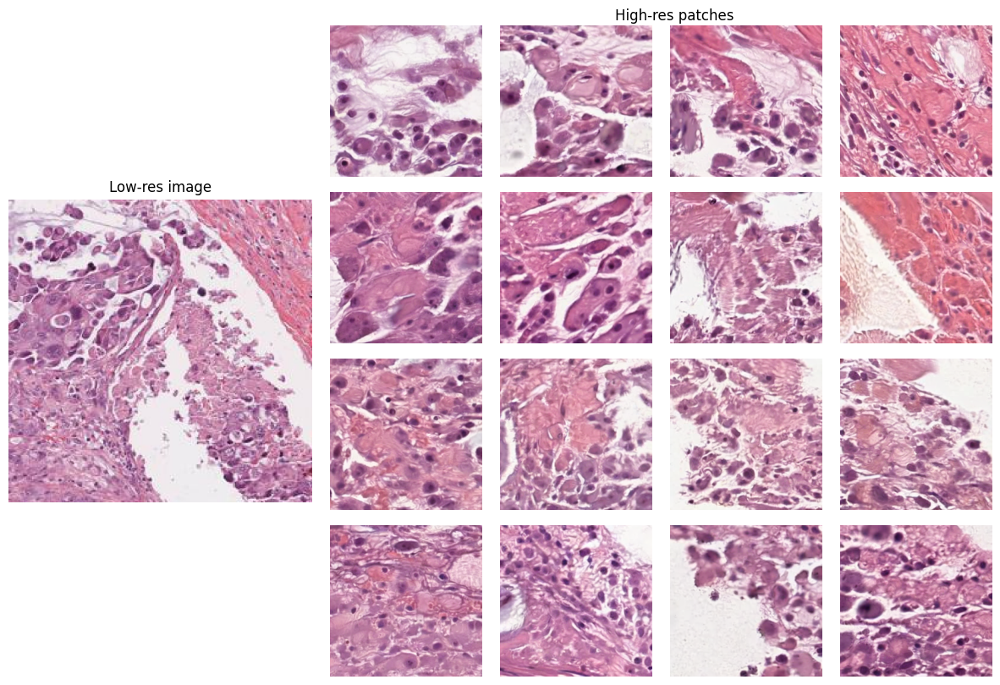

In [18]:
# Decode 20x patches
images_20x = []
for idx_20x in range(0, xt_20x_all.shape[0], batch_size):
    images_20x.append(model.decode_first_stage(xt_20x_all[idx_20x:idx_20x+batch_size,...]))
images_20x = torch.cat(images_20x, dim=0)
print("Images 20x:", images_20x.shape)

# Visualuze low-res image and generated patches
# Since we just generated from the inferred conditions we do not expect the structures to match
# But the 'content' of each patch should be similar to the content of the same low-res image region
fig = plt.figure(figsize=(15,10))
gs = GridSpec(nrows=4, ncols=5, width_ratios=[2, 1, 1, 1, 1], wspace=0.1, hspace=0.1)

ax_lr = fig.add_subplot(gs[:, 0])
ax_lr.imshow(lr_image[0])
ax_lr.axis('off')
ax_lr.set_title("Low-res image")
fig.suptitle("High-res patches", x=0.65, y=0.9)

for idx in range(emb_h*emb_w):
    row = idx // 4
    col = idx % 4
    ax = fig.add_subplot(gs[row, col + 1])  # +1 to skip the big-image column
    ax.imshow((0.5*(images_20x[idx]+1)).clamp(0,1).cpu().numpy().transpose([1,2,0]))
    ax.axis('off')

plt.tight_layout()
plt.show()

## Super-resolution

In [19]:
# Diffusion parameters
t0 = 1000
stride = 50
print("Total steps", t0//stride)

guidance = 2
batch_size = 1 # Reduce if GPU memory is limited

# Consisntecy between scales
h = 0.005 # delta constant for numerical approximation
lr = 0.5 # Learning rate

# Number of steps
# Decrease for speed -- less faithful to the lower magnification
# 5x: we find that 10 works well
# 1.25x: we can use 1 to make generation fast
n_steps = 5

Total steps 20


In [20]:
# Decide lower magnification conditioning shape
if MAG == "10x":
    emb_h, emb_w = 2, 2
elif MAG == "5x":
    emb_h, emb_w = 4, 4
elif MAG == "2_5x":
    emb_h, emb_w = 8, 8
elif MAG == "1_25x":
    emb_h, emb_w = 16, 16

# Rearrange SSL embeddings for 20x
with torch.no_grad():
    cond_feat_learned_norm = (cond_feat_learned - cond_feat_learned.mean(0, keepdim=True)) / cond_feat_learned.std(0, keepdim=True)
    ssl_feat_20x = rearrange(cond_feat_learned_norm.detach(), 'd (p1 h) (p2 w) -> (p1 p2) d h w', p1=emb_h, p2=emb_w)
    cond_dict_20x = dict(ssl_feat=[ssl_feat_20x[i] for i in range(ssl_feat_20x.shape[0])],
                         mag=torch.tensor([MAG_DICT["20x"]]).long().tile(ssl_feat_20x.shape[0]).to(device))
    cond_20x_all = model.get_learned_conditioning(cond_dict_20x)

# Downsampling/Upsampling operator
down_operator = Resizer((1,3,256,256), scale_factor=1/emb_h).to(device)
up_operator = Resizer((1,3,256//emb_h,256//emb_w), scale_factor=emb_h).to(device)

In [21]:
## Generate

# Initial noise
xt_20x_all = torch.randn((emb_h*emb_w,3,64,64), device=device)
img_guide = 2*(lr_image.permute([0,3,1,2]) / 255. - 0.5).float().to(device)

for idx, t in tqdm(enumerate(range(t0, 0, -stride)), total=t0//stride):
    # Schedule parameters
    atbar = model.alphas_cumprod[t-1].view(1,1,1,1).to(device)
    atbar_prev = model.alphas_cumprod[max(t-1-stride,0)].view(1,1,1,1).to(device)
    beta_tilde = (model.betas[t-1] * (1 - atbar_prev) / (1 - atbar)).view(1,1,1,1).to(device)

    
    # Denoise all patches at 20x
    x0_pred_20x_all = []
    eps_20x_all = []
    for idx_20x in range(0, xt_20x_all.shape[0], batch_size):
        # Select patches
        xt_20x = xt_20x_all[idx_20x:idx_20x+batch_size,...]
        cond_20x = cond_20x_all[idx_20x:idx_20x+batch_size,...]
        img_patches_guide = rearrange(img_guide, 'b c (p1 h) (p2 w) -> (b p1 p2) c h w', p1=emb_h, p2=emb_w)[idx_20x:idx_20x+batch_size,...]

        # Predict noise for 20x
        epsilon_20x = model_pred(model, xt_20x, t, cond_20x, w=guidance)
        x0_pred_20x = xt_20x / torch.sqrt(atbar) - epsilon_20x * torch.sqrt((1-atbar)/atbar)
        img_pred_20x = model.decode_first_stage(x0_pred_20x).clamp(-1,1)

        # Enforce consistency between guide and 20x patches
        for k in range(n_steps):
            # Reference for algorithm: https://github.com/cvlab-stonybrook/fast-constrained-sampling/blob/main/stable-diffusion/superres.ipynb
            # Compute error in image space
            xgrad = torch.zeros((xt_20x.shape[0],3,64,64), device=device, requires_grad=True)
            with torch.no_grad():
                xgrad.data = x0_pred_20x.clone()
            img_pred = model.differentiable_decode_first_stage(xgrad)
            error = torch.linalg.norm(down_operator(img_pred) - img_patches_guide)
            error_dir = -torch.autograd.grad(error, xgrad)[0]
            error_dir = error_dir / error_dir.abs().reshape(xt_20x.shape[0],-1).max(1)[0].view(-1,1,1,1)

            # Compute gradient
            xt_error_dir = xt_20x + h*error_dir
            epsilon_error_dir = model_pred(model, xt_error_dir, t, cond_20x, w=guidance)
            x0_pred_error_dir = xt_error_dir / torch.sqrt(atbar) - epsilon_error_dir * torch.sqrt((1-atbar)/atbar)
            grad = (x0_pred_error_dir - x0_pred_20x) / h

            # Normalize grad by inf-norm
            max_grad = grad.abs().reshape(xt_20x.shape[0],-1).max(1)[0].view(-1,1,1,1)
            grad = grad / max_grad
        
            # Update 20x patches
            xt_20x = xt_20x + lr*grad
        
            epsilon_20x = model_pred(model, xt_20x, t, cond_20x, w=guidance)
            x0_pred_20x = xt_20x / torch.sqrt(atbar) - epsilon_20x * torch.sqrt((1-atbar)/atbar)
            
        # Once finished, add to list of 20x patches we are generating
        x0_pred_20x_all.append(x0_pred_20x)
        eps_20x_all.append(epsilon_20x)

    # Collect patches
    x0_pred_20x_all = torch.cat(x0_pred_20x_all, dim=0)
    eps_20x_all = torch.cat(eps_20x_all, dim=0)

    # Perform denoising step
    xt_20x_all = torch.sqrt(atbar_prev)*x0_pred_20x_all + torch.sqrt(1-atbar_prev)*eps_20x_all + torch.sqrt(beta_tilde)*torch.randn_like(xt_20x_all)

100%|██████████| 20/20 [05:39<00:00, 17.00s/it]


Images 20x: torch.Size([16, 3, 256, 256])


/tmp/ipykernel_2526561/3598776051.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


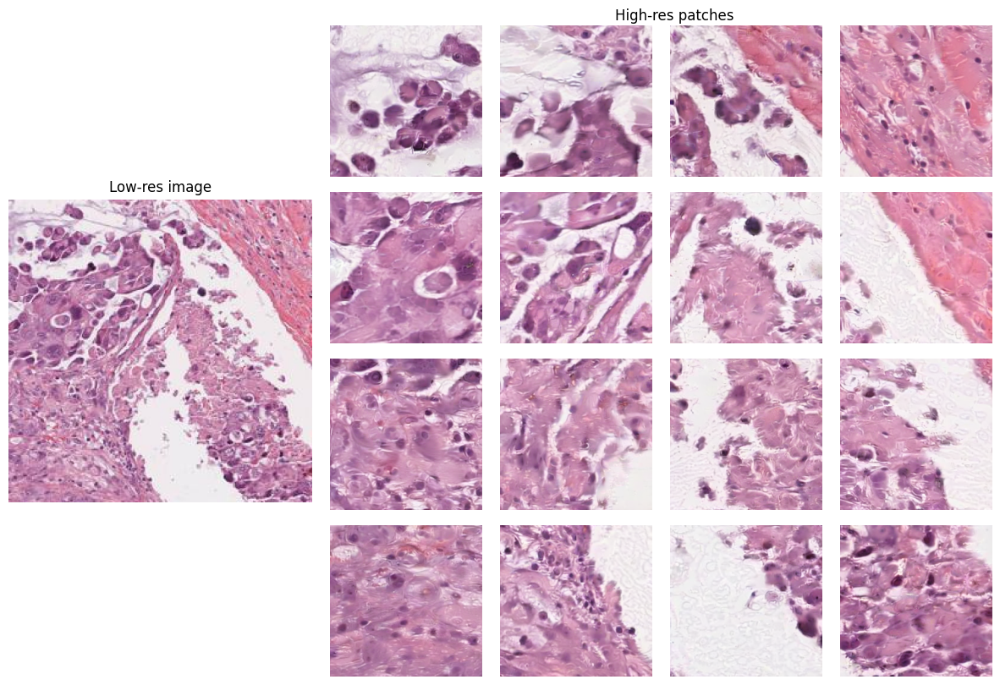

In [22]:
# Decode 20x patches
images_20x = []
for idx_20x in range(0, xt_20x_all.shape[0], batch_size):
    images_20x.append(model.decode_first_stage(xt_20x_all[idx_20x:idx_20x+batch_size,...]))
images_20x = torch.cat(images_20x, dim=0)
print("Images 20x:", images_20x.shape)

# Visualuze low-res image and generated patches
# Now that we applied the low-res image constraint the two should match
fig = plt.figure(figsize=(15,10))
gs = GridSpec(nrows=4, ncols=5, width_ratios=[2, 1, 1, 1, 1], wspace=0.1, hspace=0.1)

ax_lr = fig.add_subplot(gs[:, 0])
ax_lr.imshow(lr_image[0])
ax_lr.axis('off')
ax_lr.set_title("Low-res image")
fig.suptitle("High-res patches", x=0.65, y=0.9)

for idx in range(emb_h*emb_w):
    row = idx // 4
    col = idx % 4
    ax = fig.add_subplot(gs[row, col + 1])  # +1 to skip the big-image column
    ax.imshow((0.5*(images_20x[idx]+1)).clamp(0,1).cpu().numpy().transpose([1,2,0]))
    ax.axis('off')

plt.tight_layout()
plt.show()

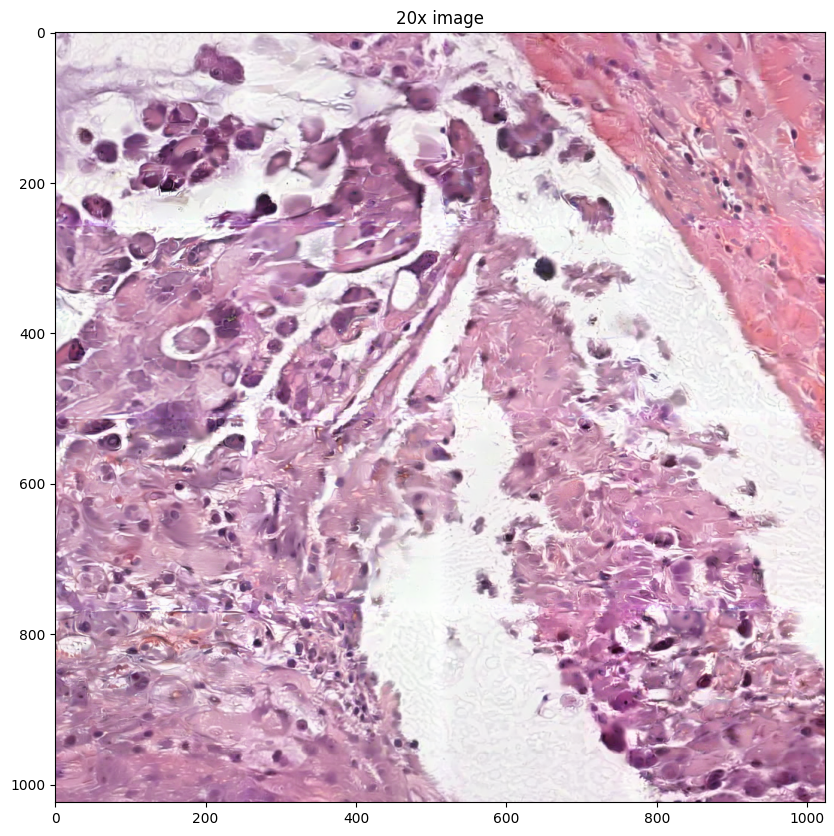

In [23]:
# Rearrange into one image and decode
xt_20x = rearrange(xt_20x_all, '(b p1 p2) c h w -> b c (p1 h) (p2 w)', p1=emb_h, p2=emb_w)
image_20x = decode_large_image(xt_20x, model)

plt.figure(figsize=(10,10))
plt.imshow(image_20x[0])
plt.title('20x image')
plt.show()

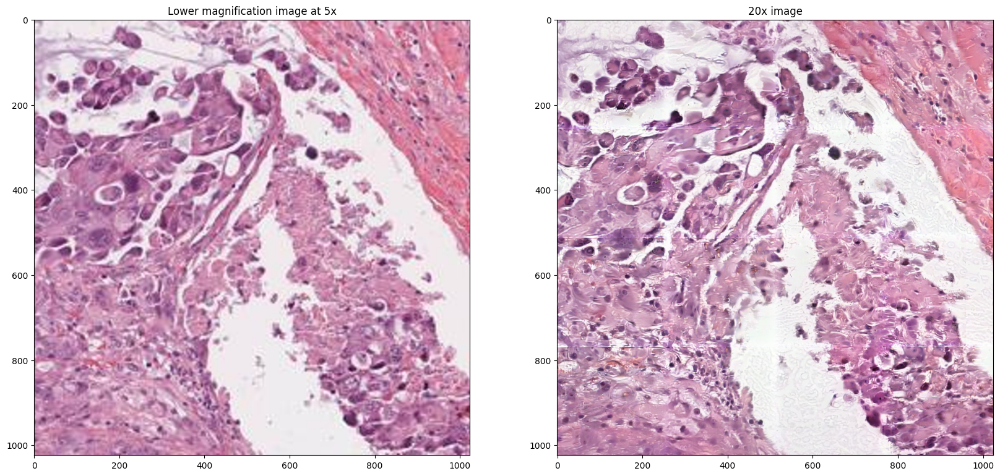

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
ax[0].imshow(Image.fromarray(lr_image[0].numpy()).resize((1024,1024)))
ax[0].set_title(f'Lower magnification image at {MAG}')
ax[1].imshow(Image.fromarray(image_20x[0]))
ax[1].set_title('20x image')
plt.show()

## (Optional) Postprocessing

In [ ]:
from large_image_gen.postprocess import postprocess_image

# We postprocess the image by adding noise and denoising at 20x
# This eliminates border artifacts
t0 = 300 # Adding more noise can alter the content of the image, deviating from the lower magnification guide
stride = 50
guidance = 2

# Ground truth embeddings
# Use for comparison with inferred
# ssl_feat = batch['ssl_feat_unpooled'][0].float().to(device)
# Inferred embeddings
ssl_feat = cond_feat_learned

xt_20x_all_postprocessed = postprocess_image(
    model, xt_20x_all, ssl_feat,
    t0, stride, guidance,
    sliding_window_size=16, emb_h=emb_h, emb_w=emb_w, batch_size=16)

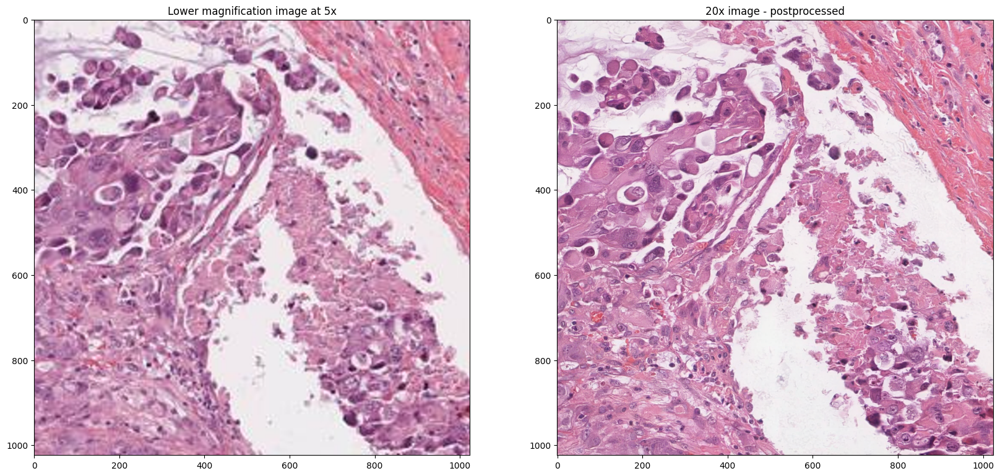

In [26]:
xt_20x_postprocessed = rearrange(xt_20x_all_postprocessed, '(b p1 p2) c h w -> b c (p1 h) (p2 w)', p1=emb_h, p2=emb_w)
image_20x_postprocessed = decode_large_image(xt_20x_postprocessed, model)

fig, ax = plt.subplots(1, 2, figsize=(20,10))
ax[0].imshow(Image.fromarray(lr_image[0].numpy()).resize((1024,1024)))
ax[0].set_title(f'Lower magnification image at {MAG}')
ax[1].imshow(Image.fromarray(image_20x_postprocessed[0]))
ax[1].set_title('20x image - postprocessed')
plt.show()